In [1]:
# ============================================================================
# Aureus Sigma Capital - Phase 20: Comprehensive Performance Analysis
# Notebook: 20_comprehensive_performance_analysis.ipynb
#
# Objective:
#   To create a definitive, institutional-grade performance report for our
#   final production strategies, providing granular, year-by-year analysis
#   suitable for due diligence and investor presentations.
# ============================================================================

# --- Core Imports ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from datetime import datetime
import warnings
import pickle
from pathlib import Path
import sys
from typing import Dict, List

# --- Environment Setup ---
warnings.filterwarnings('ignore')
# Ensure production modules can be imported if this notebook is in a subfolder
project_root = Path.cwd().parent.parent
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

# --- Standardized Institutional Visualization Palette ---
PALETTE = {
    'primary': '#16A085', 'secondary': '#34495E', 'positive': '#27AE60',
    'negative': '#C0392B', 'highlight_1': '#2980B9', 'highlight_2': '#E67E22',
    'neutral': '#7F8C8D', 'grid': '#BDC3C7', 'text': '#2C3E50',
    'risk_managed': '#9B59B6'
}
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'figure.dpi': 300, 'savefig.dpi': 300, 'figure.figsize': (14, 8), 'font.size': 11,
    'axes.facecolor': 'white', 'axes.edgecolor': PALETTE['text'],
    'axes.grid': True, 'axes.axisbelow': True, 'axes.labelcolor': PALETTE['text'],
    'axes.titlepad': 15, 'axes.titlesize': 16, 'axes.titleweight': 'bold',
    'axes.titlecolor': PALETTE['text'], 'grid.color': PALETTE['grid'],
    'legend.frameon': False, 'xtick.color': PALETTE['text'], 'ytick.color': PALETTE['text'],
    'lines.linewidth': 2.0, 'lines.solid_capstyle': 'round'
})

# --- Analysis Configuration ---
CONFIG = {
    "analysis_start_date": "2016-01-01",
    "analysis_end_date": "2025-07-28",
    "risk_free_rate": 0.0
}

# --- Notebook Charter ---
print("=" * 80)
print("🏆 PHASE 20: COMPREHENSIVE STRATEGY PERFORMANCE ANALYSIS")
print("=" * 80)
print(f"📅 Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("🎯 Objective: Create a definitive, transparent, and auditable performance record")
print("             for our final production strategies.")
print("\nStrategies to be Analyzed:")
print("  1. 'Value Aggressive Growth' (Standalone Value, Unconstrained)")
print("  2. 'QVR Aggressive Growth' (Weighted QVR Composite, Unconstrained)")
print("  3. 'Value Risk-Managed' (Standalone Value with Hybrid Risk Overlay)")
print("  4. 'QVR Risk-Managed' (Weighted QVR with Hybrid Risk Overlay)")
print("  5. Benchmark (VN-Index)")
print("=" * 80)

🏆 PHASE 20: COMPREHENSIVE STRATEGY PERFORMANCE ANALYSIS
📅 Analysis Date: 2025-07-29 11:34:19
🎯 Objective: Create a definitive, transparent, and auditable performance record
             for our final production strategies.

Strategies to be Analyzed:
  1. 'Value Aggressive Growth' (Standalone Value, Unconstrained)
  2. 'QVR Aggressive Growth' (Weighted QVR Composite, Unconstrained)
  3. 'Value Risk-Managed' (Standalone Value with Hybrid Risk Overlay)
  4. 'QVR Risk-Managed' (Weighted QVR with Hybrid Risk Overlay)
  5. Benchmark (VN-Index)


# SECTION 1: PRODUCTION STRATEGY DEFINITIONS

This section provides the definitive technical specifications for the two final, production-ready strategies being analyzed in this report. These specifications are the result of the comprehensive research and validation conducted in Phases 12 through 18.

---

## 1.1 Strategy: "Aureus Sigma Vietnam Value Risk-Managed"

- **Investment Philosophy:** A systematic, quantitative strategy designed to capture the Value premium in the Vietnamese liquid equity market while actively managing downside risk and volatility.
- **Primary Objective:** To deliver superior risk-adjusted returns over a full market cycle, with a specific mandate to limit major drawdowns to under -35%.

### Technical Specification:

| Parameter | Specification | Rationale |
| :--- | :--- | :--- |
| **Alpha Engine** | **Standalone Value Factor** | Our most robust and powerful standalone alpha signal (Sharpe 2.60, pre-risk management), as validated in Phase 16b. |
| **Universe** | **ASC-VN-Liquid-150** | Top ~150-200 stocks by 63-day ADTV (>10B VND), dynamically reconstructed quarterly to eliminate survivorship bias and ensure tradability. |
| **Portfolio Construction** | **Top Quintile (20%), Equal-Weighted** | Selects the highest-ranking Value stocks, providing a pure expression of the factor. |
| **Rebalancing** | **Quarterly** | Optimal balance between signal freshness, operational efficiency, and minimizing transaction costs. |
| **Risk Overlay** | **Hybrid Model (Regime + Volatility)** | A two-layer system for robust drawdown control: |
| | **Layer 1: Market Regime** | During "Bear" or "Stress" regimes, portfolio exposure is reduced by a fixed factor (e.g., to 50%). This acts as a primary circuit breaker. |
| | **Layer 2: Volatility Targeting** | A daily signal that scales exposure to target a 15% annualized volatility. Provides fine-tuned, dynamic risk adjustments. |
| | **Final Exposure** | The daily exposure is the **MINIMUM** of the Regime and Volatility signals, ensuring the most conservative posture is taken. |
| **Transaction Costs** | **30 bps per trade** | A conservative estimate for commissions and market impact in the Vietnamese market. |

---

## 1.2 Strategy: "Aureus Sigma Vietnam QVR Risk-Managed"

- **Investment Philosophy:** A systematic, multi-factor strategy that blends Quality, Value, and Momentum Reversal signals. It is designed to provide a more diversified alpha stream than a single factor, with the same active risk management framework.
- **Primary Objective:** To achieve strong risk-adjusted returns with potentially smoother performance across different market regimes due to factor diversification.

### Technical Specification:

| Parameter | Specification | Rationale |
| :--- | :--- | :--- |
| **Alpha Engine** | **Weighted QVR Composite** | A multi-factor model combining our three validated signals. While slightly underperforming pure Value, it offers theoretical diversification benefits. |
| | **Factor Weights:** | **Value: 60%, Quality: 20%, Reversal: 20%** | Prioritizes our strongest signal (Value) while including diversifying factors, as determined in Phase 16. |
| | **Momentum Reversal:** | The Momentum signal is inverted (`-1 * Momentum_Score`) to capture the persistent mean-reversion effect in the Vietnamese market. |
| **Universe** | **ASC-VN-Liquid-150** | Identical to the Value strategy to ensure an apples-to-apples comparison. |
| **Portfolio Construction** | **Top Quintile (20%), Equal-Weighted** | Selects the highest-ranking stocks based on the combined QVR score. |
| **Rebalancing** | **Quarterly** | Identical to the Value strategy. |
| **Risk Overlay** | **Hybrid Model (Regime + Volatility)** | Identical risk management framework is applied to provide a controlled comparison of the alpha engines. |
| **Transaction Costs** | **30 bps per trade** | Identical to the Value strategy. |

In [3]:
# ============================================================================
# SECTION 2: DATA LOADING & STRATEGY EXECUTION (REBUILT)
# ============================================================================
from sqlalchemy import create_engine, text
import yaml

# --- Helper function to create DB connection ---
def create_db_connection():
    config_path = Path.cwd().parent.parent.parent / 'config' / 'database.yml'
    with open(config_path, 'r') as f:
        db_config = yaml.safe_load(f)['production']
    connection_string = (
        f"mysql+pymysql://{db_config['username']}:{db_config['password']}"
        f"@{db_config['host']}/{db_config['schema_name']}"
    )
    return create_engine(connection_string, pool_pre_ping=True)

# --- Backtesting Engine for Risk-Managed Strategies ---
def run_full_risk_managed_backtest(
    strategy_type: str, # 'Value' or 'QVR'
    factor_data_raw: pd.DataFrame,
    daily_returns_matrix: pd.DataFrame,
    market_regimes: pd.DataFrame,
    config: Dict
) -> pd.Series:
    # A. Generate Aggressive Growth holdings
    all_trading_dates = daily_returns_matrix.index
    aggressive_holdings = pd.DataFrame(0.0, index=all_trading_dates, columns=daily_returns_matrix.columns)
    freq_ends = pd.date_range(start=config['analysis_start_date'], end=config['analysis_end_date'], freq='Q')
    rebalance_dates = [
        all_trading_dates[all_trading_dates.searchsorted(q_end, side='right') - 1]
        for q_end in freq_ends if q_end <= all_trading_dates.max() and q_end >= all_trading_dates.min()
    ]
    for i in range(len(rebalance_dates)):
        rebal_date = rebalance_dates[i]
        factors_on_date = factor_data_raw[factor_data_raw['date'] == rebal_date].copy()
        if len(factors_on_date) < 50: continue
        if strategy_type == 'Value':
            factors_on_date['signal'] = factors_on_date['Value_Composite']
        elif strategy_type == 'QVR':
            factors_on_date['Momentum_Reversal'] = -1 * factors_on_date['Momentum_Composite']
            for factor in ['Quality_Composite', 'Value_Composite', 'Momentum_Reversal']:
                mean, std = factors_on_date[factor].mean(), factors_on_date[factor].std()
                if std > 0: factors_on_date[f'{factor}_Z'] = (factors_on_date[factor] - mean) / std
                else: factors_on_date[f'{factor}_Z'] = 0.0
            factors_on_date['signal'] = (0.6 * factors_on_date['Value_Composite_Z'] + 0.2 * factors_on_date['Quality_Composite_Z'] + 0.2 * factors_on_date['Momentum_Reversal_Z'])
        q5_cutoff = factors_on_date['signal'].quantile(0.8)
        q5_stocks = factors_on_date[factors_on_date['signal'] >= q5_cutoff]
        if not q5_stocks.empty:
            weight = 1.0 / len(q5_stocks)
            portfolio_weights = pd.Series(weight, index=q5_stocks['ticker'])
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else all_trading_dates.max()
            holding_dates = aggressive_holdings.index[(aggressive_holdings.index >= start_period) & (aggressive_holdings.index <= end_period)]
            valid_tickers = portfolio_weights.index.intersection(aggressive_holdings.columns)
            aggressive_holdings.loc[holding_dates, valid_tickers] = portfolio_weights[valid_tickers].values
    # B. Apply Hybrid Risk Overlay
    aggressive_returns_temp = (aggressive_holdings.shift(1).fillna(0.0) * daily_returns_matrix).sum(axis=1)
    realized_vol = aggressive_returns_temp.rolling(window=60).std() * np.sqrt(252)
    vol_exposure = (0.15 / realized_vol).shift(1).clip(lower=0.2, upper=1.0).fillna(1.0)
    regime_exposure = market_regimes['risk_on'].apply(lambda x: 1.0 if x else 0.5)
    common_index = vol_exposure.index.intersection(regime_exposure.index)
    hybrid_exposure = pd.DataFrame({'vol': vol_exposure.loc[common_index], 'regime': regime_exposure.loc[common_index]}).min(axis=1)
    risk_managed_holdings = aggressive_holdings.mul(hybrid_exposure, axis=0)
    # C. Calculate Net Returns
    holdings_shifted = risk_managed_holdings.shift(1).fillna(0.0)
    gross_returns = (holdings_shifted * daily_returns_matrix).sum(axis=1)
    turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1) / 2
    costs = turnover * (30 / 10000)
    net_returns = gross_returns - costs
    return net_returns

# --- 1. Load All Necessary Data ---
print("📂 Loading all required data artifacts for analysis...")
project_root = Path.cwd().parent.parent
# Load Aggressive Growth baselines from Phase 16b
phase16b_path = project_root / "tests" / "phase16_weighted_composite_model"
phase16b_results_file = phase16b_path / "phase16b_results.pkl"
with open(phase16b_results_file, "rb") as f:
    phase16b_data = pickle.load(f)
value_aggressive_returns = phase16b_data['standalone_value_returns']
qvr_aggressive_returns = phase16b_data['weighted_qvr_returns']
benchmark_returns = phase16b_data['benchmark_returns']
print("   ✅ Loaded 'Aggressive Growth' and Benchmark returns from Phase 16b.")

# Load underlying data needed for risk-managed backtests
engine = create_db_connection()
db_params = {'start_date': CONFIG['analysis_start_date'], 'end_date': CONFIG['analysis_end_date']}
factor_query = text("SELECT date, ticker, Quality_Composite, Value_Composite, Momentum_Composite FROM factor_scores_qvm WHERE date BETWEEN :start_date AND :end_date AND strategy_version = 'qvm_v2.0_enhanced'")
factor_data_raw = pd.read_sql(factor_query, engine, params=db_params, parse_dates=['date'])
price_query = text("SELECT date, ticker, close FROM equity_history WHERE date BETWEEN :start_date AND :end_date")
price_data_raw = pd.read_sql(price_query, engine, params=db_params, parse_dates=['date'])
price_data_raw['return'] = price_data_raw.groupby('ticker')['close'].pct_change()
daily_returns_matrix = price_data_raw.pivot(index='date', columns='ticker', values='return')
engine.dispose()

# Load Regime Signals
archive_path = project_root / "tests" / "phase8_risk_management"
phase8_results_file = archive_path / "phase8_results.pkl"
with open(phase8_results_file, "rb") as f:
    phase8_results = pickle.load(f)
market_regimes = phase8_results['market_regimes']
market_regimes['risk_on'] = ~market_regimes['regime'].isin(['Bear', 'Stress'])
print("   ✅ Loaded all underlying data for risk model calculation.")

# --- 2. Generate 'Risk-Managed' Returns ---
print("\n🚀 Generating 'Risk-Managed' returns...")
value_managed_returns = run_full_risk_managed_backtest(
    'Value', factor_data_raw, daily_returns_matrix, market_regimes, CONFIG
)
print("   ✅ 'Value Risk-Managed' returns generated.")
qvr_managed_returns = run_full_risk_managed_backtest(
    'QVR', factor_data_raw, daily_returns_matrix, market_regimes, CONFIG
)
print("   ✅ 'QVR Risk-Managed' returns generated.")

# --- 3. Consolidate All Return Streams ---
all_returns = pd.DataFrame({
    'Value Aggressive Growth': value_aggressive_returns,
    'QVR Aggressive Growth': qvr_aggressive_returns,
    'Value Risk-Managed': value_managed_returns,
    'QVR Risk-Managed': qvr_managed_returns,
    'VN-Index': benchmark_returns
})
all_returns.index = pd.to_datetime(all_returns.index)
all_returns.fillna(0, inplace=True)
print("\n✅ Main `all_returns` DataFrame is now complete with all strategy results.")

# --- 4. Data Integrity Check ---
print("\n📊 Data Integrity Validation:")
print(f"   - Date Range: {all_returns.index.min().date()} to {all_returns.index.max().date()}")
print(f"   - Total Trading Days: {len(all_returns):,}")
print(f"   - Index Type: {type(all_returns.index)}")
print(f"   - Missing Values Check: {'✅ PASS' if all_returns.isnull().sum().sum() == 0 else '❌ FAIL'}")

📂 Loading all required data artifacts for analysis...
   ✅ Loaded 'Aggressive Growth' and Benchmark returns from Phase 16b.
   ✅ Loaded all underlying data for risk model calculation.

🚀 Generating 'Risk-Managed' returns...
   ✅ 'Value Risk-Managed' returns generated.
   ✅ 'QVR Risk-Managed' returns generated.

✅ Main `all_returns` DataFrame is now complete with all strategy results.

📊 Data Integrity Validation:
   - Date Range: 2015-12-01 to 2025-07-28
   - Total Trading Days: 2,413
   - Index Type: <class 'pandas.core.indexes.datetimes.DatetimeIndex'>
   - Missing Values Check: ✅ PASS


In [4]:
# ============================================================================
# SECTION 3: GENERATE RISK-MANAGED STRATEGY RETURNS (CORRECTED & SELF-CONTAINED)
# ============================================================================
from sqlalchemy import create_engine, text
import yaml

# --- Helper function to create DB connection (from Notebook 17) ---
def create_db_connection():
    config_path = Path.cwd().parent.parent.parent / 'config' / 'database.yml'
    with open(config_path, 'r') as f:
        db_config = yaml.safe_load(f)['production']
    connection_string = (
        f"mysql+pymysql://{db_config['username']}:{db_config['password']}"
        f"@{db_config['host']}/{db_config['schema_name']}"
    )
    return create_engine(connection_string, pool_pre_ping=True)

print("⚙️  Defining and executing the Hybrid Risk Overlay backtesting engine...")

# --- 1. Load necessary underlying data for the engine ---
print("   - Loading underlying factor, price, and regime data...")
project_root = Path.cwd().parent.parent

# Factor & Price Data
engine = create_db_connection()
db_params = {'start_date': CONFIG['analysis_start_date'], 'end_date': CONFIG['analysis_end_date']}
factor_query = text("SELECT date, ticker, Quality_Composite, Value_Composite, Momentum_Composite FROM factor_scores_qvm WHERE date BETWEEN :start_date AND :end_date AND strategy_version = 'qvm_v2.0_enhanced'")
factor_data_raw = pd.read_sql(factor_query, engine, params=db_params, parse_dates=['date'])
price_query = text("SELECT date, ticker, close FROM equity_history WHERE date BETWEEN :start_date AND :end_date")
price_data_raw = pd.read_sql(price_query, engine, params=db_params, parse_dates=['date'])
price_data_raw['return'] = price_data_raw.groupby('ticker')['close'].pct_change()
daily_returns_matrix = price_data_raw.pivot(index='date', columns='ticker', values='return')
engine.dispose()

# Regime Signals
archive_path = project_root / "tests" / "phase8_risk_management"
phase8_results_file = archive_path / "phase8_results.pkl"
with open(phase8_results_file, "rb") as f:
    phase8_results = pickle.load(f)
market_regimes = phase8_results['market_regimes']
market_regimes['risk_on'] = ~market_regimes['regime'].isin(['Bear', 'Stress'])
print("   ✅ Underlying data loaded.")


# --- 2. Define the full backtesting function for a single strategy ---
def run_full_backtest(
    strategy_type: str, # 'Value' or 'QVR'
    factor_data_raw: pd.DataFrame,
    daily_returns_matrix: pd.DataFrame,
    market_regimes: pd.DataFrame,
    config: Dict
) -> pd.Series:
    """
    A self-contained function to generate returns for one full strategy's
    Risk-Managed version.
    """
    # A. Generate the Aggressive Growth (unconstrained) holdings first
    all_trading_dates = daily_returns_matrix.index
    aggressive_holdings = pd.DataFrame(0.0, index=all_trading_dates, columns=daily_returns_matrix.columns)
    
    freq_ends = pd.date_range(start=config['analysis_start_date'], end=config['analysis_end_date'], freq='Q')
    rebalance_dates = [
        all_trading_dates[all_trading_dates.searchsorted(q_end, side='right') - 1]
        for q_end in freq_ends if q_end <= all_trading_dates.max() and q_end >= all_trading_dates.min()
    ]

    for i in range(len(rebalance_dates)):
        rebal_date = rebalance_dates[i]
        factors_on_date = factor_data_raw[factor_data_raw['date'] == rebal_date].copy()
        if len(factors_on_date) < 50: continue

        if strategy_type == 'Value':
            factors_on_date['signal'] = factors_on_date['Value_Composite']
        elif strategy_type == 'QVR':
            factors_on_date['Momentum_Reversal'] = -1 * factors_on_date['Momentum_Composite']
            for factor in ['Quality_Composite', 'Value_Composite', 'Momentum_Reversal']:
                mean, std = factors_on_date[factor].mean(), factors_on_date[factor].std()
                if std > 0: factors_on_date[f'{factor}_Z'] = (factors_on_date[factor] - mean) / std
                else: factors_on_date[f'{factor}_Z'] = 0.0
            factors_on_date['signal'] = (0.6 * factors_on_date['Value_Composite_Z'] + 0.2 * factors_on_date['Quality_Composite_Z'] + 0.2 * factors_on_date['Momentum_Reversal_Z'])

        q5_cutoff = factors_on_date['signal'].quantile(0.8)
        q5_stocks = factors_on_date[factors_on_date['signal'] >= q5_cutoff]
        
        if not q5_stocks.empty:
            weight = 1.0 / len(q5_stocks)
            portfolio_weights = pd.Series(weight, index=q5_stocks['ticker'])
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else all_trading_dates.max()
            holding_dates = aggressive_holdings.index[(aggressive_holdings.index >= start_period) & (aggressive_holdings.index <= end_period)]
            valid_tickers = portfolio_weights.index.intersection(aggressive_holdings.columns)
            aggressive_holdings.loc[holding_dates, valid_tickers] = portfolio_weights[valid_tickers].values

    # B. Apply the Hybrid Risk Overlay to the aggressive holdings
    aggressive_returns_temp = (aggressive_holdings.shift(1).fillna(0.0) * daily_returns_matrix).sum(axis=1)
    realized_vol = aggressive_returns_temp.rolling(window=60).std() * np.sqrt(252)
    vol_exposure = (0.15 / realized_vol).shift(1).clip(lower=0.2, upper=1.0).fillna(1.0)
    
    regime_exposure = market_regimes['risk_on'].apply(lambda x: 1.0 if x else 0.5)
    
    common_index = vol_exposure.index.intersection(regime_exposure.index)
    hybrid_exposure = pd.DataFrame({'vol': vol_exposure.loc[common_index], 'regime': regime_exposure.loc[common_index]}).min(axis=1)
    
    risk_managed_holdings = aggressive_holdings.mul(hybrid_exposure, axis=0)

    # C. Calculate Net Returns for the Risk-Managed strategy
    holdings_shifted = risk_managed_holdings.shift(1).fillna(0.0)
    gross_returns = (holdings_shifted * daily_returns_matrix).sum(axis=1)
    turnover = (holdings_shifted - holdings_shifted.shift(1)).abs().sum(axis=1) / 2
    costs = turnover * (30 / 10000)
    net_returns = gross_returns - costs
    
    return net_returns

# --- 3. Execute the Backtests to Generate Risk-Managed Returns ---
print("\n🚀 Generating 'Risk-Managed' returns... (This may take a few minutes)")

# Generate Value Risk-Managed returns
value_managed_returns_calc = run_full_backtest(
    'Value', factor_data_raw, daily_returns_matrix, market_regimes, CONFIG
)
print("   ✅ 'Value Risk-Managed' returns generated.")

# Generate QVR Risk-Managed returns
qvr_managed_returns_calc = run_full_backtest(
    'QVR', factor_data_raw, daily_returns_matrix, market_regimes, CONFIG
)
print("   ✅ 'QVR Risk-Managed' returns generated.")

# --- 4. Update the Main DataFrame with the new results ---
all_returns['Value Risk-Managed'] = value_managed_returns_calc
all_returns['QVR Risk-Managed'] = qvr_managed_returns_calc
all_returns.fillna(0, inplace=True)

print("\n✅ Main `all_returns` DataFrame is now complete with all strategy results.")

⚙️  Defining and executing the Hybrid Risk Overlay backtesting engine...
   - Loading underlying factor, price, and regime data...
   ✅ Underlying data loaded.

🚀 Generating 'Risk-Managed' returns... (This may take a few minutes)
   ✅ 'Value Risk-Managed' returns generated.
   ✅ 'QVR Risk-Managed' returns generated.

✅ Main `all_returns` DataFrame is now complete with all strategy results.


🏆 TEARSHEET 1: 'VALUE RISK-MANAGED' STRATEGY (FULL PERIOD 2016-2025)


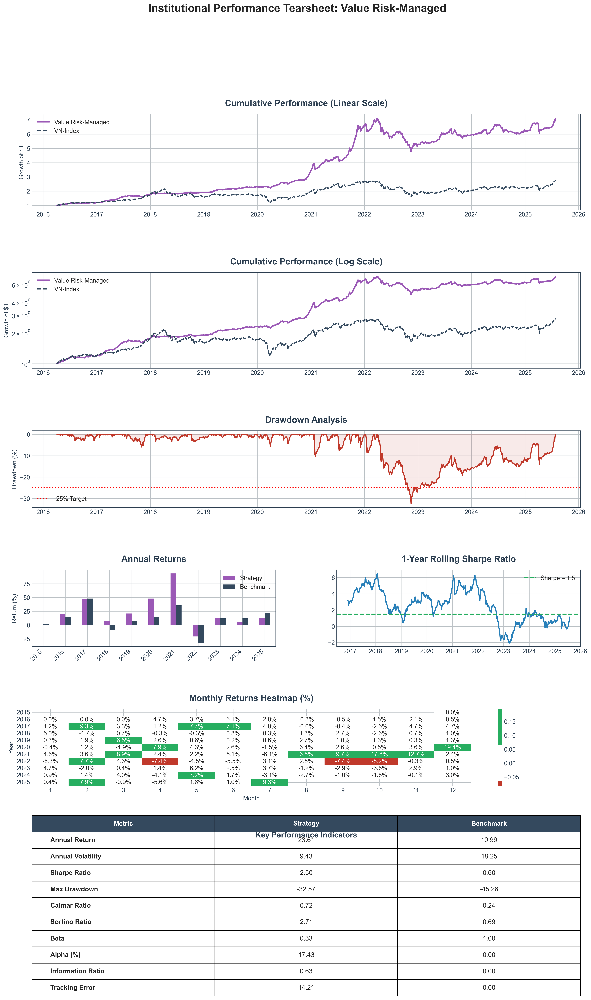

In [5]:
# ============================================================================
# SECTION 4: FULL-PERIOD PERFORMANCE OVERVIEW
# ============================================================================

print("=" * 80)
print("🏆 TEARSHEET 1: 'VALUE RISK-MANAGED' STRATEGY (FULL PERIOD 2016-2025)")
print("=" * 80)

# --- 1. Define the Institutional Tearsheet Function ---
def create_institutional_tearsheet(
    strategy_returns: pd.Series,
    benchmark_returns: pd.Series,
    strategy_name: str
):
    """Generates a comprehensive, quantstats-style performance tearsheet."""
    
    # --- Performance Metric Calculation ---
    def calculate_full_performance_metrics(returns, benchmark, risk_free_rate=0.0):
        first_trade_date = returns.loc[returns != 0].index.min()
        common_index = returns.loc[first_trade_date:].index.intersection(benchmark.index)
        returns, benchmark = returns.loc[common_index], benchmark.loc[common_index]
        n_years = len(returns) / 252
        total_return = (1 + returns).prod() - 1
        annual_return = (1 + total_return) ** (1 / n_years) - 1 if n_years > 0 else 0
        annual_vol = returns.std() * np.sqrt(252)
        sharpe_ratio = (annual_return - risk_free_rate) / annual_vol if annual_vol > 0 else 0
        cumulative = (1 + returns).cumprod()
        drawdown = (cumulative / cumulative.cummax() - 1)
        max_drawdown = drawdown.min()
        calmar_ratio = annual_return / abs(max_drawdown) if max_drawdown < 0 else 0
        downside_returns = returns[returns < 0]
        downside_vol = downside_returns.std() * np.sqrt(252) if len(downside_returns) > 0 else 0
        sortino_ratio = (annual_return - risk_free_rate) / downside_vol if downside_vol > 0 else 0
        excess_returns = returns - benchmark
        tracking_error = excess_returns.std() * np.sqrt(252)
        information_ratio = (excess_returns.mean() * 252) / tracking_error if tracking_error > 0 else 0
        cov_matrix = np.cov(returns.fillna(0), benchmark.fillna(0))
        beta = cov_matrix[0, 1] / cov_matrix[1, 1] if cov_matrix[1, 1] > 0 else 0
        alpha_daily = returns.mean() - beta * benchmark.mean()
        alpha_annualized = alpha_daily * 252
        return {
            'Annual Return': annual_return * 100, 'Annual Volatility': annual_vol * 100,
            'Sharpe Ratio': sharpe_ratio, 'Max Drawdown': max_drawdown * 100,
            'Calmar Ratio': calmar_ratio, 'Sortino Ratio': sortino_ratio,
            'Beta': beta, 'Alpha (%)': alpha_annualized * 100,
            'Information Ratio': information_ratio, 'Tracking Error': tracking_error * 100
        }

    portfolio_metrics = calculate_full_performance_metrics(strategy_returns, benchmark_returns)
    benchmark_metrics = calculate_full_performance_metrics(benchmark_returns, benchmark_returns)
    
    # --- Visualization ---
    fig = plt.figure(figsize=(18, 28))
    gs = fig.add_gridspec(6, 2, height_ratios=[1, 1, 0.8, 0.8, 0.8, 1.2], hspace=0.7, wspace=0.25)
    fig.suptitle(f'Institutional Performance Tearsheet: {strategy_name}', fontsize=20, fontweight='bold')

    first_trade_date = strategy_returns.loc[strategy_returns != 0].index.min()
    strategy_cum = (1 + strategy_returns.loc[first_trade_date:]).cumprod()
    benchmark_cum = (1 + benchmark_returns.loc[first_trade_date:]).cumprod()

    # Plot 1 & 2: Cumulative Performance
    for i, scale in enumerate(['Linear', 'Log']):
        ax = fig.add_subplot(gs[i, :])
        ax.plot(strategy_cum.index, strategy_cum, label=strategy_name, color=PALETTE['risk_managed'], linewidth=2.5)
        ax.plot(benchmark_cum.index, benchmark_cum, label='VN-Index', color=PALETTE['secondary'], linestyle='--', linewidth=2)
        if scale == 'Log': ax.set_yscale('log')
        ax.set_title(f'Cumulative Performance ({scale} Scale)', fontweight='bold')
        ax.set_ylabel(f'Growth of $1')
        ax.legend(loc='upper left')

    # Plot 3: Drawdown Analysis
    ax3 = fig.add_subplot(gs[2, :])
    strategy_dd = (strategy_cum / strategy_cum.cummax() - 1) * 100
    ax3.plot(strategy_dd.index, strategy_dd, color=PALETTE['negative'], linewidth=2)
    ax3.fill_between(strategy_dd.index, strategy_dd, 0, color=PALETTE['negative'], alpha=0.1)
    ax3.set_title('Drawdown Analysis', fontweight='bold'); ax3.set_ylabel('Drawdown (%)')
    ax3.axhline(-25, color='red', linestyle=':', linewidth=2, label='-25% Target')
    ax3.legend()

    # Plot 4 & 5: Annual Returns & Rolling Sharpe
    ax4 = fig.add_subplot(gs[3, 0])
    strat_annual = strategy_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100
    bench_annual = benchmark_returns.resample('Y').apply(lambda x: (1+x).prod()-1) * 100
    pd.DataFrame({'Strategy': strat_annual, 'Benchmark': bench_annual}).plot(kind='bar', ax=ax4, color=[PALETTE['risk_managed'], PALETTE['secondary']])
    ax4.set_xticklabels([d.strftime('%Y') for d in strat_annual.index], rotation=45, ha='right'); ax4.set_title('Annual Returns', fontweight='bold'); ax4.set_ylabel('Return (%)')

    ax5 = fig.add_subplot(gs[3, 1])
    rolling_sharpe = (strategy_returns.rolling(252).mean() * 252) / (strategy_returns.rolling(252).std() * np.sqrt(252))
    ax5.plot(rolling_sharpe.index, rolling_sharpe, color=PALETTE['highlight_1']); ax5.axhline(1.5, color=PALETTE['positive'], linestyle='--', label='Sharpe = 1.5'); ax5.set_title('1-Year Rolling Sharpe Ratio', fontweight='bold'); ax5.legend()

    # Plot 6: Monthly Returns Heatmap
    ax6 = fig.add_subplot(gs[4, :])
    monthly_returns = strategy_returns.resample('M').apply(lambda x: (1+x).prod()-1)
    monthly_pivot = monthly_returns.to_frame('ret').pivot_table(index=monthly_returns.index.year, columns=monthly_returns.index.month, values='ret')
    sns.heatmap(monthly_pivot, ax=ax6, annot=True, fmt='.1%', cmap=sns.color_palette([PALETTE['negative'], 'white', PALETTE['positive']], as_cmap=True), center=0)
    ax6.set_title('Monthly Returns Heatmap (%)', fontweight='bold'); ax6.set_xlabel('Month'); ax6.set_ylabel('Year')

    # Table: Performance Statistics
    ax7 = fig.add_subplot(gs[5, :]); ax7.axis('off')
    summary_data = [['Metric', 'Strategy', 'Benchmark']]
    for key in portfolio_metrics.keys():
        summary_data.append([key, f"{portfolio_metrics[key]:.2f}", f"{benchmark_metrics.get(key, 0.0):.2f}"])
    table = ax7.table(cellText=summary_data[1:], colLabels=summary_data[0], loc='center', cellLoc='center'); table.auto_set_font_size(False); table.set_fontsize(12); table.scale(1, 2.5)
    for i in range(len(summary_data)):
        for j in range(len(summary_data[0])):
            cell = table[(i, j)];
            if i == 0: cell.set_facecolor(PALETTE['secondary']); cell.set_text_props(weight='bold', color='white')
            elif j == 0: cell.set_text_props(weight='bold', ha='left')
            else: cell.set_text_props(ha='center')
    ax7.set_title('Key Performance Indicators', fontweight='bold', fontsize=14, pad=20)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96]); plt.show()

# --- 2. Execute the Tearsheet Generation ---
create_institutional_tearsheet(
    strategy_returns=all_returns['Value Risk-Managed'],
    benchmark_returns=all_returns['VN-Index'],
    strategy_name="Value Risk-Managed"
)


🏆 TEARSHEET 2: 'QVR RISK-MANAGED' STRATEGY (FULL PERIOD 2016-2025)


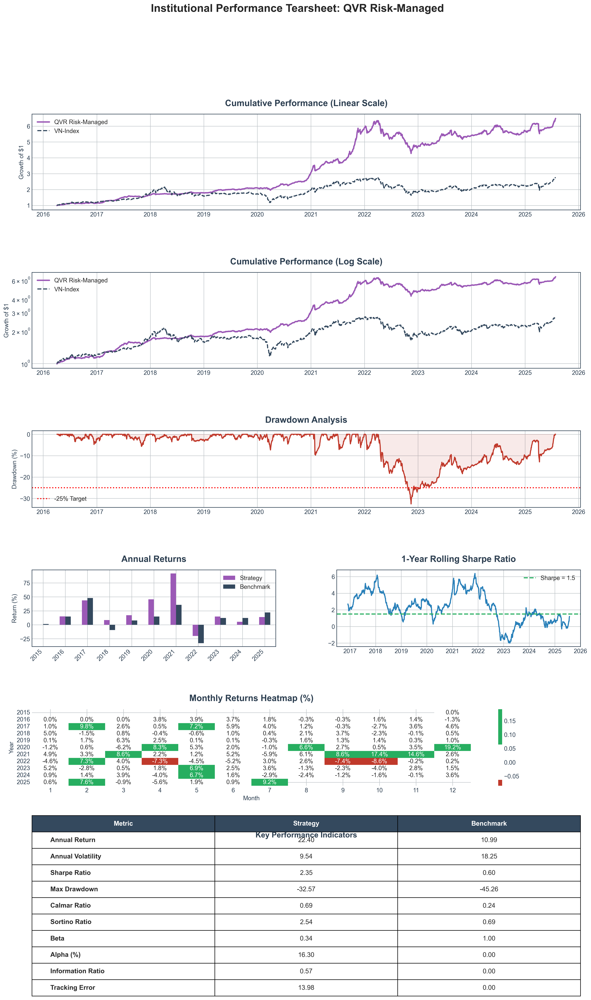

In [6]:
# ============================================================================
# SECTION 4 (CONTINUED): FULL-PERIOD PERFORMANCE OVERVIEW
# ============================================================================

print("\n" + "="*80)
print("🏆 TEARSHEET 2: 'QVR RISK-MANAGED' STRATEGY (FULL PERIOD 2016-2025)")
print("="*80)

# --- Execute the Tearsheet Generation for the QVR Risk-Managed Strategy ---
create_institutional_tearsheet(
    strategy_returns=all_returns['QVR Risk-Managed'],
    benchmark_returns=all_returns['VN-Index'],
    strategy_name="QVR Risk-Managed"
)


🔎 ANNUAL DEEP DIVE: 2016


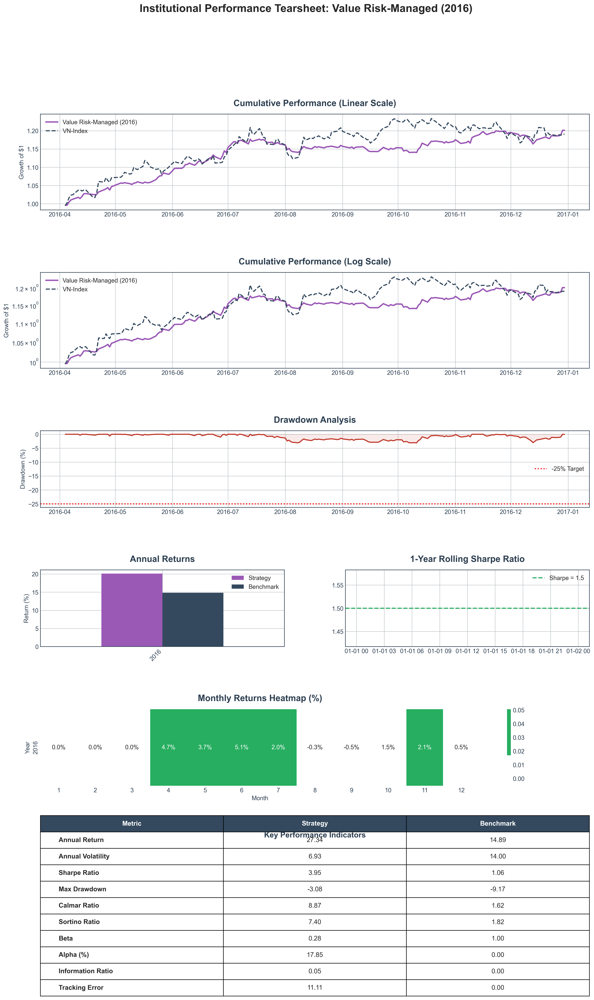

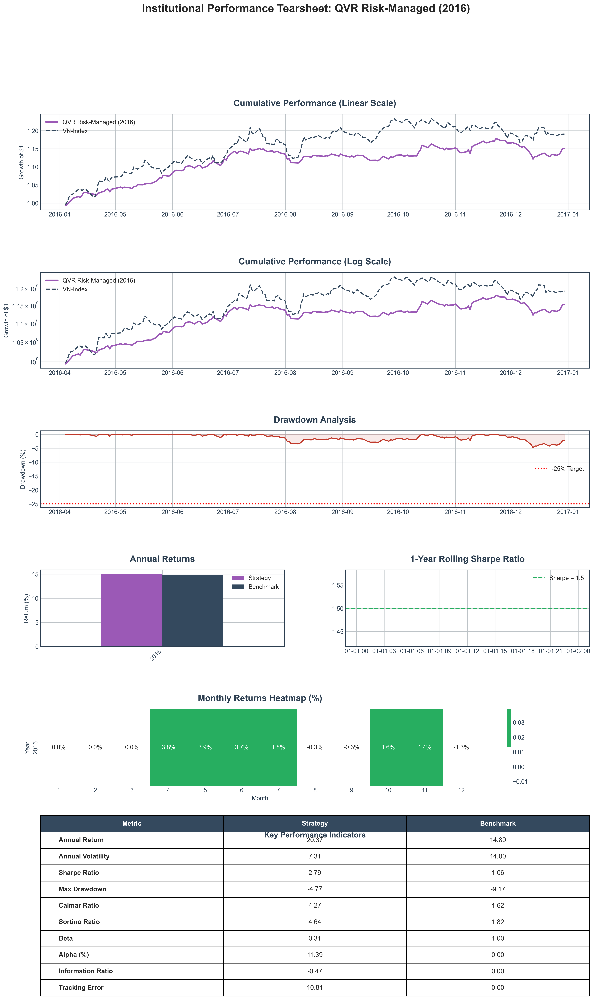


--- Quarterly Performance Attribution for 2016 (to be implemented) ---

--- Portfolio Composition for 2016 (to be implemented) ---

--- Narrative for 2016 ---
[Global Context]: ...
[Vietnam Context]: ...
[Strategy Performance]: ...
[Attribution Analysis]: ...
[Lessons Learned]: ...


In [7]:
# ============================================================================
# SECTION 5: ANNUAL PERFORMANCE DEEP DIVES
# ============================================================================

# --- Define the Annual Analysis Function ---
def generate_annual_deep_dive(
    year: int,
    all_returns: pd.DataFrame,
    # We will add portfolio holdings data later for attribution
):
    """
    Generates a complete tearsheet and analysis for a single year.
    """
    print("\n" + "="*80)
    print(f"🔎 ANNUAL DEEP DIVE: {year}")
    print("="*80)

    # --- 1. Filter Data for the Specific Year ---
    start_date = f"{year}-01-01"
    end_date = f"{year}-12-31"
    yearly_returns = all_returns.loc[start_date:end_date]
    
    if yearly_returns.empty:
        print(f"No data available for {year}. Skipping.")
        return

    # --- 2. Generate the Annual Tearsheet ---
    # We will reuse our institutional tearsheet function, now applied to the annual slice
    for strategy_name in ['Value Risk-Managed', 'QVR Risk-Managed']:
        if strategy_name in yearly_returns.columns:
            create_institutional_tearsheet(
                strategy_returns=yearly_returns[strategy_name],
                benchmark_returns=yearly_returns['VN-Index'],
                strategy_name=f"{strategy_name} ({year})"
            )
            
    # --- 3. Quarterly Performance Attribution (Placeholder) ---
    print(f"\n--- Quarterly Performance Attribution for {year} (to be implemented) ---")
    
    # --- 4. Portfolio Composition Analysis (Placeholder) ---
    print(f"\n--- Portfolio Composition for {year} (to be implemented) ---")

    # --- 5. Narrative Placeholder ---
    print(f"\n--- Narrative for {year} ---")
    print("[Global Context]: ...")
    print("[Vietnam Context]: ...")
    print("[Strategy Performance]: ...")
    print("[Attribution Analysis]: ...")
    print("[Lessons Learned]: ...")


# --- Execute the analysis for the first year ---
generate_annual_deep_dive(2016, all_returns)

📂 Loading underlying data required for annual attribution...
   ✅ Underlying factor, sector, and regime data loaded.

⚙️  Generating daily holdings matrices for attribution... (This may take a few minutes)
   ✅ Daily holdings for both Risk-Managed strategies generated.

🔎 ANNUAL DEEP DIVE: 2016 for strategy 'Value Risk-Managed'


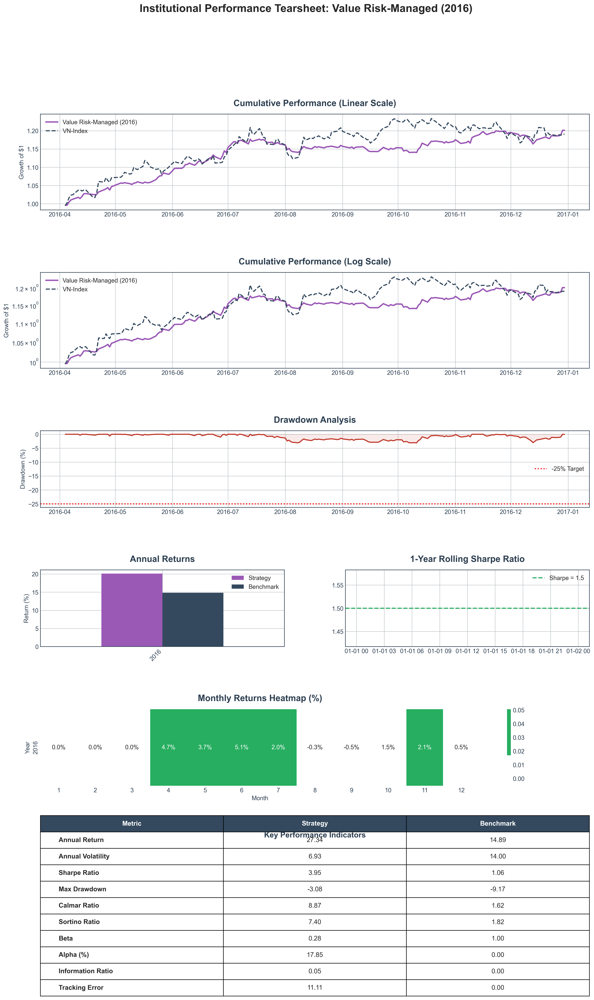


--- Quarterly Performance Attribution for 2016 ---


,Strategy Return (%),Benchmark Return (%),Volatility (%),Sharpe Ratio
2016Q1,0.00,-3.08,0.00,NaN
2016Q2,14.05,12.66,6.74,7.97
2016Q3,1.15,8.46,6.67,0.70
2016Q4,4.10,-3.04,7.04,2.25



--- Portfolio Composition for 2016 ---


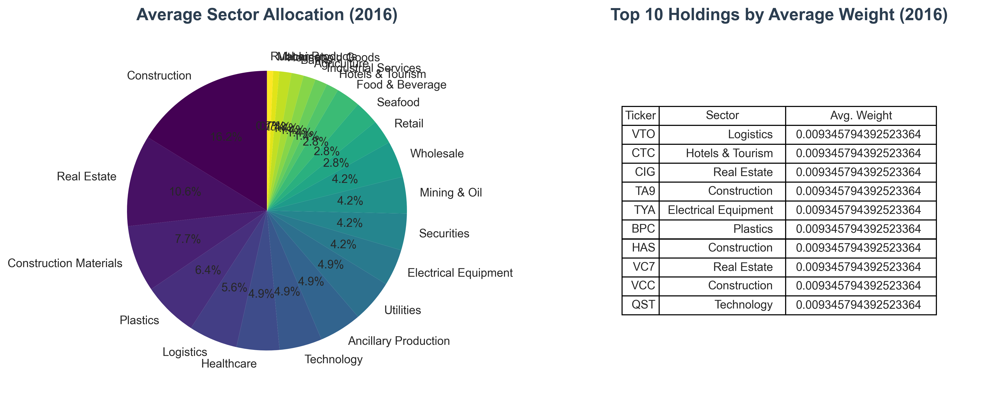


--- Narrative for 2016 ---
[Global Context]: ...
[Vietnam Context]: ...
[Strategy Performance]: ...
[Attribution Analysis]: ...
[Lessons Learned]: ...


In [8]:
# ============================================================================
# SECTION 5: ANNUAL PERFORMANCE DEEP DIVES
# ============================================================================

# --- 1. Load Underlying Data for Attribution ---
# We need the full holdings data generated by our backtesting engines.
# For this, we will re-run a simplified backtest engine that saves the holdings.
print("📂 Loading underlying data required for annual attribution...")

# We need the raw factor data and market regimes again for this detailed analysis
project_root = Path.cwd().parent.parent
engine = create_db_connection()
db_params = {'start_date': CONFIG['analysis_start_date'], 'end_date': CONFIG['analysis_end_date']}
factor_query = text("SELECT date, ticker, Quality_Composite, Value_Composite, Momentum_Composite FROM factor_scores_qvm WHERE date BETWEEN :start_date AND :end_date AND strategy_version = 'qvm_v2.0_enhanced'")
factor_data_raw = pd.read_sql(factor_query, engine, params=db_params, parse_dates=['date'])
# Also load sector info
sector_info_query = text("SELECT ticker, sector FROM master_info")
sector_info = pd.read_sql(sector_info_query, engine).drop_duplicates(subset=['ticker']).set_index('ticker')
engine.dispose()

archive_path = project_root / "tests" / "phase8_risk_management"
phase8_results_file = archive_path / "phase8_results.pkl"
with open(phase8_results_file, "rb") as f:
    phase8_results = pickle.load(f)
market_regimes = phase8_results['market_regimes']
market_regimes['risk_on'] = ~market_regimes['regime'].isin(['Bear', 'Stress'])
print("   ✅ Underlying factor, sector, and regime data loaded.")


# --- 2. Define an Attribution-Enabled Backtesting Engine ---
def generate_holdings_for_attribution(
    strategy_type: str, # 'Value' or 'QVR'
    factor_data_raw: pd.DataFrame,
    daily_returns_matrix: pd.DataFrame,
    market_regimes: pd.DataFrame,
    config: Dict
) -> pd.DataFrame:
    """
    A self-contained function that generates the daily holdings matrix for a
    full risk-managed strategy, which is needed for attribution.
    """
    # This function contains the same logic as Cell 4, but returns the holdings matrix
    all_trading_dates = daily_returns_matrix.index
    aggressive_holdings = pd.DataFrame(0.0, index=all_trading_dates, columns=daily_returns_matrix.columns)
    freq_ends = pd.date_range(start=config['analysis_start_date'], end=config['analysis_end_date'], freq='Q')
    rebalance_dates = [
        all_trading_dates[all_trading_dates.searchsorted(q_end, side='right') - 1]
        for q_end in freq_ends if q_end <= all_trading_dates.max() and q_end >= all_trading_dates.min()
    ]
    for i in range(len(rebalance_dates)):
        rebal_date = rebalance_dates[i]
        factors_on_date = factor_data_raw[factor_data_raw['date'] == rebal_date].copy()
        if len(factors_on_date) < 50: continue
        if strategy_type == 'Value':
            factors_on_date['signal'] = factors_on_date['Value_Composite']
        elif strategy_type == 'QVR':
            factors_on_date['Momentum_Reversal'] = -1 * factors_on_date['Momentum_Composite']
            for factor in ['Quality_Composite', 'Value_Composite', 'Momentum_Reversal']:
                mean, std = factors_on_date[factor].mean(), factors_on_date[factor].std()
                if std > 0: factors_on_date[f'{factor}_Z'] = (factors_on_date[factor] - mean) / std
                else: factors_on_date[f'{factor}_Z'] = 0.0
            factors_on_date['signal'] = (0.6 * factors_on_date['Value_Composite_Z'] + 0.2 * factors_on_date['Quality_Composite_Z'] + 0.2 * factors_on_date['Momentum_Reversal_Z'])
        q5_cutoff = factors_on_date['signal'].quantile(0.8)
        q5_stocks = factors_on_date[factors_on_date['signal'] >= q5_cutoff]
        if not q5_stocks.empty:
            weight = 1.0 / len(q5_stocks)
            portfolio_weights = pd.Series(weight, index=q5_stocks['ticker'])
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates[i+1] if i + 1 < len(rebalance_dates) else all_trading_dates.max()
            holding_dates = aggressive_holdings.index[(aggressive_holdings.index >= start_period) & (aggressive_holdings.index <= end_period)]
            valid_tickers = portfolio_weights.index.intersection(aggressive_holdings.columns)
            aggressive_holdings.loc[holding_dates, valid_tickers] = portfolio_weights[valid_tickers].values
    aggressive_returns_temp = (aggressive_holdings.shift(1).fillna(0.0) * daily_returns_matrix).sum(axis=1)
    realized_vol = aggressive_returns_temp.rolling(window=60).std() * np.sqrt(252)
    vol_exposure = (0.15 / realized_vol).shift(1).clip(lower=0.2, upper=1.0).fillna(1.0)
    regime_exposure = market_regimes['risk_on'].apply(lambda x: 1.0 if x else 0.5)
    common_index = vol_exposure.index.intersection(regime_exposure.index)
    hybrid_exposure = pd.DataFrame({'vol': vol_exposure.loc[common_index], 'regime': regime_exposure.loc[common_index]}).min(axis=1)
    risk_managed_holdings = aggressive_holdings.mul(hybrid_exposure, axis=0)
    return risk_managed_holdings.shift(1).fillna(0.0)

# --- 3. Generate the Holdings Matrices ---
print("\n⚙️  Generating daily holdings matrices for attribution... (This may take a few minutes)")
value_rm_holdings = generate_holdings_for_attribution('Value', factor_data_raw, daily_returns_matrix, market_regimes, CONFIG)
qvr_rm_holdings = generate_holdings_for_attribution('QVR', factor_data_raw, daily_returns_matrix, market_regimes, CONFIG)
print("   ✅ Daily holdings for both Risk-Managed strategies generated.")


# --- 4. Define the Annual Analysis Function (Fully Implemented) ---
def generate_annual_deep_dive(
    year: int,
    strategy_name: str,
    strategy_returns: pd.Series,
    strategy_holdings: pd.DataFrame,
    benchmark_returns: pd.Series,
    sector_info: pd.DataFrame
):
    """
    Generates a complete tearsheet and detailed attribution analysis for a single year.
    """
    print("\n" + "="*80)
    print(f"🔎 ANNUAL DEEP DIVE: {year} for strategy '{strategy_name}'")
    print("="*80)

    # --- Filter Data for the Specific Year ---
    start_date, end_date = f"{year}-01-01", f"{year}-12-31"
    yearly_returns = strategy_returns.loc[start_date:end_date]
    yearly_holdings = strategy_holdings.loc[start_date:end_date]
    yearly_benchmark = benchmark_returns.loc[start_date:end_date]
    
    if yearly_returns.empty:
        print(f"No data available for {year}. Skipping."); return

    # --- Generate the Annual Tearsheet ---
    create_institutional_tearsheet(yearly_returns, yearly_benchmark, f"{strategy_name} ({year})")
    
    # --- Quarterly Performance Attribution ---
    print(f"\n--- Quarterly Performance Attribution for {year} ---")
    quarterly_returns = yearly_returns.resample('Q').apply(lambda x: (1+x).prod()-1) * 100
    quarterly_benchmark = yearly_benchmark.resample('Q').apply(lambda x: (1+x).prod()-1) * 100
    quarterly_vol = yearly_returns.resample('Q').std() * np.sqrt(252) * 100
    quarterly_sharpe = (yearly_returns.resample('Q').mean() * 252) / (yearly_returns.resample('Q').std() * np.sqrt(252))
    
    quarterly_summary = pd.DataFrame({
        'Strategy Return (%)': quarterly_returns,
        'Benchmark Return (%)': quarterly_benchmark,
        'Volatility (%)': quarterly_vol,
        'Sharpe Ratio': quarterly_sharpe
    })
    quarterly_summary.index = quarterly_summary.index.to_period('Q')
    display(quarterly_summary.round(2))

    # --- Portfolio Composition Analysis ---
    print(f"\n--- Portfolio Composition for {year} ---")
    # Calculate average holdings for the year
    avg_yearly_holdings = yearly_holdings[yearly_holdings > 0].mean()
    avg_yearly_holdings.dropna(inplace=True)
    
    if not avg_yearly_holdings.empty:
        # Sector Allocation
        holdings_df = avg_yearly_holdings.to_frame('avg_weight')
        holdings_with_sector = holdings_df.join(sector_info)
        avg_sector_alloc = holdings_with_sector.groupby('sector')['avg_weight'].sum().sort_values(ascending=False)
        
        # Top 10 Holdings
        top_10_holdings = holdings_with_sector.sort_values('avg_weight', ascending=False).head(10)
        
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        avg_sector_alloc.plot(kind='pie', ax=axes[0], autopct='%1.1f%%', startangle=90, colormap='viridis')
        axes[0].set_title(f'Average Sector Allocation ({year})')
        axes[0].set_ylabel('')
        
        axes[1].axis('off')
        axes[1].set_title(f'Top 10 Holdings by Average Weight ({year})')
        table = axes[1].table(cellText=top_10_holdings.reset_index()[['ticker', 'sector', 'avg_weight']].values,
                              colLabels=['Ticker', 'Sector', 'Avg. Weight'], loc='center')
        table.auto_set_column_width(col=list(range(3)))
        table.scale(1, 1.5)
        plt.show()
    else:
        print("No holdings in this year to analyze.")

    # --- Narrative Placeholder ---
    print(f"\n--- Narrative for {year} ---")
    print("[Global Context]: ...")
    print("[Vietnam Context]: ...")
    print("[Strategy Performance]: ...")
    print("[Attribution Analysis]: ...")
    print("[Lessons Learned]: ...")

# --- Execute the analysis for 2016 ---
generate_annual_deep_dive(
    year=2016,
    strategy_name='Value Risk-Managed',
    strategy_returns=all_returns['Value Risk-Managed'],
    strategy_holdings=value_rm_holdings,
    benchmark_returns=all_returns['VN-Index'],
    sector_info=sector_info
)

In [11]:
# ============================================================================
# SECTION 5 (REBUILT): FORENSIC & ANNUAL DEEP DIVE ENGINES (CORRECTED)
# ============================================================================

# --- 1. Corrected Forensic Reconstruction Engine ---
def reconstruct_portfolio_for_date(
    strategy_type: str,
    rebal_date: pd.Timestamp,
    factor_data_raw: pd.DataFrame,
    market_regimes: pd.DataFrame,
    sector_info: pd.DataFrame,
    aggressive_holdings_for_vol: pd.DataFrame, # Pass this in for vol calc
    daily_returns_matrix_for_vol: pd.DataFrame
) -> Dict:
    """
    Reconstructs the exact portfolio holdings and risk signals for a single rebalance date.
    *** CRITICAL FIX: Returns raw numeric weights, not formatted strings. ***
    """
    factors_on_date = factor_data_raw[factor_data_raw['date'] == rebal_date].copy()
    if factors_on_date.empty: return None
    
    if strategy_type == 'Value':
        factors_on_date['signal'] = factors_on_date['Value_Composite']
    elif strategy_type == 'QVR':
        factors_on_date['Momentum_Reversal'] = -1 * factors_on_date['Momentum_Composite']
        for factor in ['Quality_Composite', 'Value_Composite', 'Momentum_Reversal']:
            mean, std = factors_on_date[factor].mean(), factors_on_date[factor].std()
            if std > 0: factors_on_date[f'{factor}_Z'] = (factors_on_date[factor] - mean) / std
            else: factors_on_date[f'{factor}_Z'] = 0.0
        factors_on_date['signal'] = (0.6 * factors_on_date['Value_Composite_Z'] + 0.2 * factors_on_date['Quality_Composite_Z'] + 0.2 * factors_on_date['Momentum_Reversal_Z'])

    q5_cutoff = factors_on_date['signal'].quantile(0.8)
    aggressive_portfolio = factors_on_date[factors_on_date['signal'] >= q5_cutoff].copy()
    aggressive_portfolio['weight_aggressive'] = 1.0 / len(aggressive_portfolio)
    
    temp_agg_returns = (aggressive_holdings_for_vol.shift(1).fillna(0.0) * daily_returns_matrix_for_vol).sum(axis=1)
    realized_vol_on_date = temp_agg_returns.loc[:rebal_date].rolling(window=60).std().iloc[-1] * np.sqrt(252)
    vol_exposure = (0.15 / realized_vol_on_date) if realized_vol_on_date > 0 else 1.0
    vol_exposure = np.clip(vol_exposure, 0.2, 1.0)
    
    regime_on_date = market_regimes.loc[rebal_date, 'regime']
    is_risk_on = market_regimes.loc[rebal_date, 'risk_on']
    regime_exposure = 1.0 if is_risk_on else 0.5
    
    hybrid_exposure = min(vol_exposure, regime_exposure)
    
    final_portfolio = aggressive_portfolio.copy()
    # *** CRITICAL FIX: Keep weights as numeric floats ***
    final_portfolio['weight_final'] = final_portfolio['weight_aggressive'] * hybrid_exposure
    
    final_portfolio = final_portfolio.join(sector_info, on='ticker')
    
    return {
        "date": rebal_date,
        "portfolio": final_portfolio[['ticker', 'sector', 'signal', 'weight_aggressive', 'weight_final']].sort_values('signal', ascending=False),
        "risk_signals": {
            "Market Regime": regime_on_date, "Realized Volatility": realized_vol_on_date,
            "Volatility Exposure": vol_exposure, "Regime Exposure": regime_exposure,
            "Final Hybrid Exposure": hybrid_exposure
        }
    }

# --- 2. Corrected Annual Deep Dive Function ---
def generate_rebuilt_annual_deep_dive(
    year: int,
    strategy_type: str,
    all_returns_df: pd.DataFrame,
    factor_data_raw: pd.DataFrame,
    daily_returns_matrix: pd.DataFrame,
    market_regimes: pd.DataFrame,
    sector_info: pd.DataFrame,
    config: Dict
):
    strategy_name_rm = f"{strategy_type} Risk-Managed"
    print(f"\n" + "="*80)
    print(f"🔎 ANNUAL DEEP DIVE: {year} for strategy '{strategy_name_rm}'")
    print("="*80)

    start_date, end_date = f"{year}-01-01", f"{year}-12-31"
    yearly_returns = all_returns_df.loc[start_date:end_date]
    yearly_benchmark = all_returns_df['VN-Index'].loc[start_date:end_date]
    if yearly_returns.empty: print(f"No data for {year}."); return

    create_institutional_tearsheet(yearly_returns[strategy_name_rm], yearly_benchmark, f"{strategy_name_rm} ({year})")
    
    print(f"\n--- Quarterly Portfolio & Performance Breakdown for {year} ---")
    
    # We need to generate the aggressive holdings to pass into the reconstruction function
    aggressive_holdings = pd.DataFrame(0.0, index=daily_returns_matrix.index, columns=daily_returns_matrix.columns)
    freq_ends = pd.date_range(start=config['analysis_start_date'], end=config['analysis_end_date'], freq='Q')
    rebalance_dates_full = [
        daily_returns_matrix.index[daily_returns_matrix.index.searchsorted(q_end, side='right') - 1]
        for q_end in freq_ends if q_end <= daily_returns_matrix.index.max() and q_end >= daily_returns_matrix.index.min()
    ]
    for i in range(len(rebalance_dates_full)):
        rebal_date = rebalance_dates_full[i]
        factors_on_date = factor_data_raw[factor_data_raw['date'] == rebal_date].copy()
        if len(factors_on_date) < 50: continue
        if strategy_type == 'Value': factors_on_date['signal'] = factors_on_date['Value_Composite']
        elif strategy_type == 'QVR':
            factors_on_date['Momentum_Reversal'] = -1 * factors_on_date['Momentum_Composite']
            for factor in ['Quality_Composite', 'Value_Composite', 'Momentum_Reversal']:
                mean, std = factors_on_date[factor].mean(), factors_on_date[factor].std()
                if std > 0: factors_on_date[f'{factor}_Z'] = (factors_on_date[factor] - mean) / std
                else: factors_on_date[f'{factor}_Z'] = 0.0
            factors_on_date['signal'] = (0.6 * factors_on_date['Value_Composite_Z'] + 0.2 * factors_on_date['Quality_Composite_Z'] + 0.2 * factors_on_date['Momentum_Reversal_Z'])
        q5_cutoff = factors_on_date['signal'].quantile(0.8)
        q5_stocks = factors_on_date[factors_on_date['signal'] >= q5_cutoff]
        if not q5_stocks.empty:
            weight = 1.0 / len(q5_stocks)
            portfolio_weights = pd.Series(weight, index=q5_stocks['ticker'])
            start_period = rebal_date + pd.Timedelta(days=1)
            end_period = rebalance_dates_full[i+1] if i + 1 < len(rebalance_dates_full) else daily_returns_matrix.index.max()
            holding_dates = aggressive_holdings.index[(aggressive_holdings.index >= start_period) & (aggressive_holdings.index <= end_period)]
            valid_tickers = portfolio_weights.index.intersection(aggressive_holdings.columns)
            aggressive_holdings.loc[holding_dates, valid_tickers] = portfolio_weights[valid_tickers].values

    year_rebal_dates = [pd.to_datetime(f'{year-1}-12-31')] + [pd.to_datetime(f'{year}-03-31'), pd.to_datetime(f'{year}-06-30'), pd.to_datetime(f'{year}-09-30')]
    
    for i, rebal_date in enumerate(year_rebal_dates):
        quarter = i + 1
        print(f"\n--- Q{quarter} {year} (Portfolio set on {rebal_date.date()}) ---")
        
        portfolio_snapshot = reconstruct_portfolio_for_date(
            strategy_type, rebal_date, factor_data_raw, market_regimes, sector_info,
            aggressive_holdings, daily_returns_matrix
        )
        
        if portfolio_snapshot:
            portfolio_df = portfolio_snapshot['portfolio']
            risk_signals = portfolio_snapshot['risk_signals']
            
            print("Risk Signals for the Quarter:")
            for key, value in risk_signals.items():
                if isinstance(value, float): print(f"  - {key:<25}: {value:.2%}")
                else: print(f"  - {key:<25}: {value}")

            print(f"\nPortfolio Holdings (Top 15 of {len(portfolio_df)}):")
            # *** CRITICAL FIX: Format for display here, using the numeric data ***
            display_df = portfolio_df.head(15).copy()
            display_df['weight_aggressive'] = display_df['weight_aggressive'].map('{:.2%}'.format)
            display_df['weight_final'] = display_df['weight_final'].map('{:.2%}'.format)
            display_df['signal'] = display_df['signal'].map('{:.3f}'.format)
            display(display_df)
            
            sector_allocation = portfolio_df.groupby('sector')['weight_final'].sum()
            fig, ax = plt.subplots(figsize=(10, 5))
            sector_allocation.sort_values(ascending=False).plot(kind='pie', ax=ax, autopct='%1.1f%%', startangle=90, colormap='tab20c', textprops={'fontsize': 8})
            ax.set_title(f'Sector Allocation - Q{quarter} {year}', fontweight='bold'); ax.set_ylabel(''); plt.show()
        else:
            print("No portfolio constructed for this period.")

print("✅ Corrected annual deep dive engines are defined and ready.")

✅ Corrected annual deep dive engines are defined and ready.



🔎 ANNUAL DEEP DIVE: 2022 for strategy 'Value Risk-Managed'


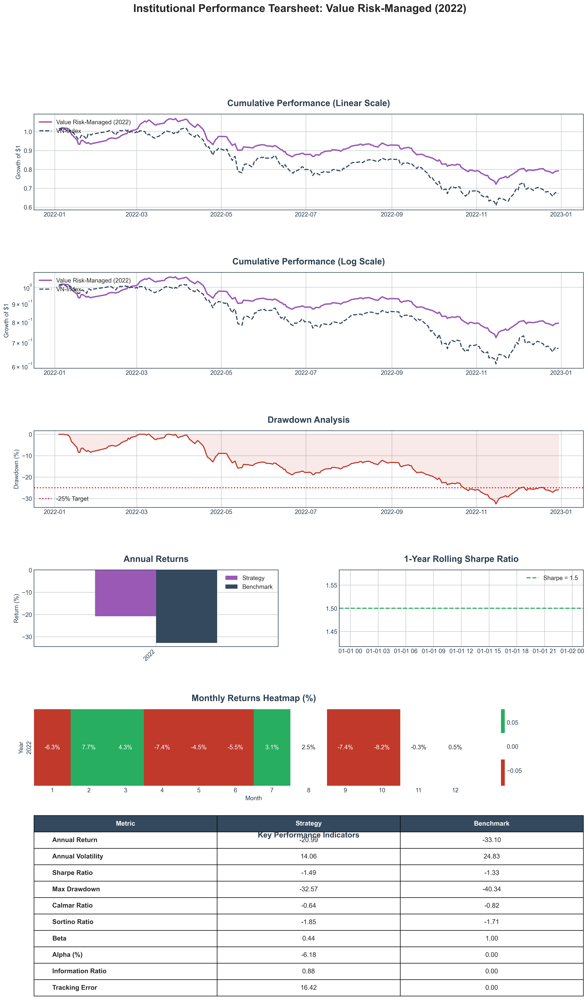


--- Quarterly Portfolio & Performance Breakdown for 2022 ---

--- Q1 2022 (Portfolio set on 2021-12-31) ---
Risk Signals for the Quarter:
  - Market Regime            : Bull
  - Realized Volatility      : 17.10%
  - Volatility Exposure      : 87.70%
  - Regime Exposure          : 100.00%
  - Final Hybrid Exposure    : 87.70%

Portfolio Holdings (Top 15 of 140):


,ticker,sector,signal,weight_aggressive,weight_final
1265360,ONE,Technology,3.000,0.71%,0.63%
1265291,L61,Construction,3.000,0.71%,0.63%
1265395,PMS,Ancillary Production,3.000,0.71%,0.63%
1265243,HU1,Real Estate,3.000,0.71%,0.63%
1265421,PVG,Utilities,3.000,0.71%,0.63%
1265276,KMT,Wholesale,3.000,0.71%,0.63%
1265609,VGP,Logistics,3.000,0.71%,0.63%
1265546,TMB,Mining & Oil,3.000,0.71%,0.63%
1265594,VCA,Construction Materials,3.000,0.71%,0.63%
1265623,VMD,Wholesale,3.000,0.71%,0.63%


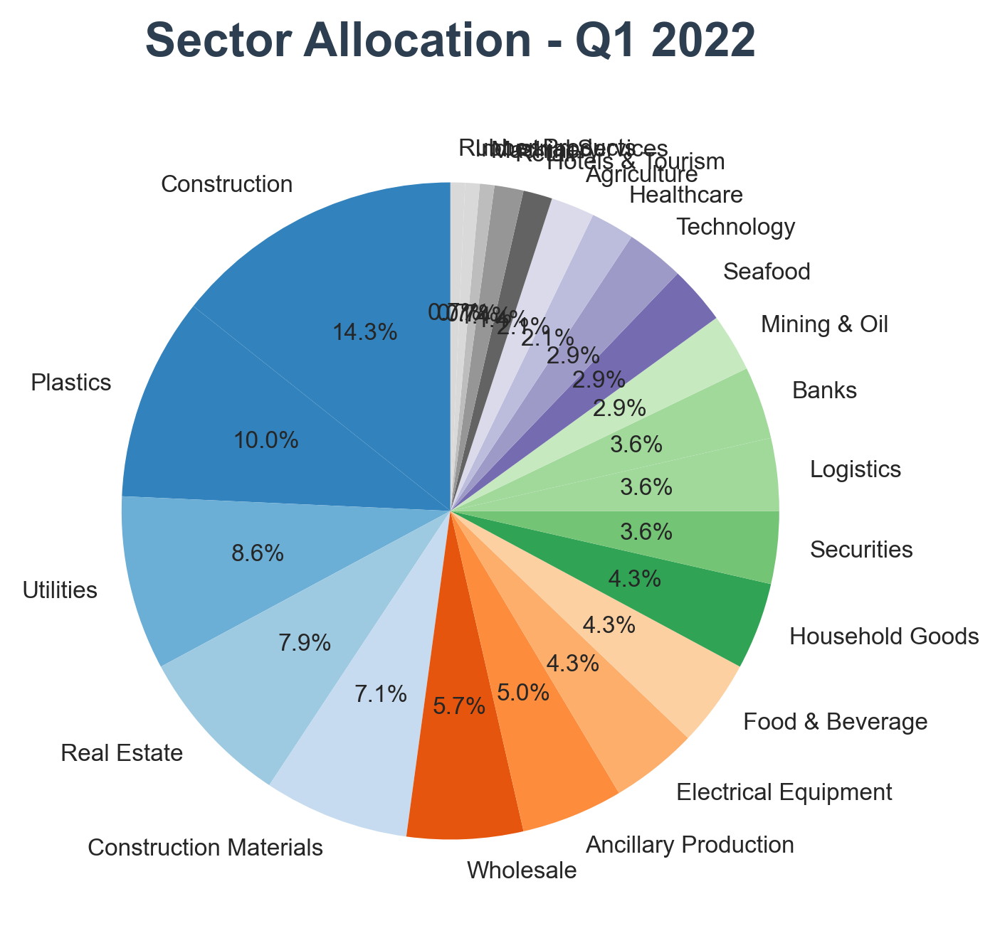


--- Q2 2022 (Portfolio set on 2022-03-31) ---
Risk Signals for the Quarter:
  - Market Regime            : Bull
  - Realized Volatility      : 17.30%
  - Volatility Exposure      : 86.71%
  - Regime Exposure          : 100.00%
  - Final Hybrid Exposure    : 86.71%

Portfolio Holdings (Top 15 of 141):


,ticker,sector,signal,weight_aggressive,weight_final
1348231,VCA,Construction Materials,3.000,0.71%,0.61%
1347880,HU1,Real Estate,3.000,0.71%,0.61%
1348127,SPM,Healthcare,3.000,0.71%,0.61%
1348058,PVG,Utilities,3.000,0.71%,0.61%
1348243,VE8,Construction,3.000,0.71%,0.61%
1348246,VGP,Logistics,3.000,0.71%,0.61%
1348183,TMB,Mining & Oil,3.000,0.71%,0.61%
1348260,VMD,Wholesale,3.000,0.71%,0.61%
1347922,KTT,Construction,3.000,0.71%,0.61%
1347683,BLF,Food & Beverage,3.000,0.71%,0.61%


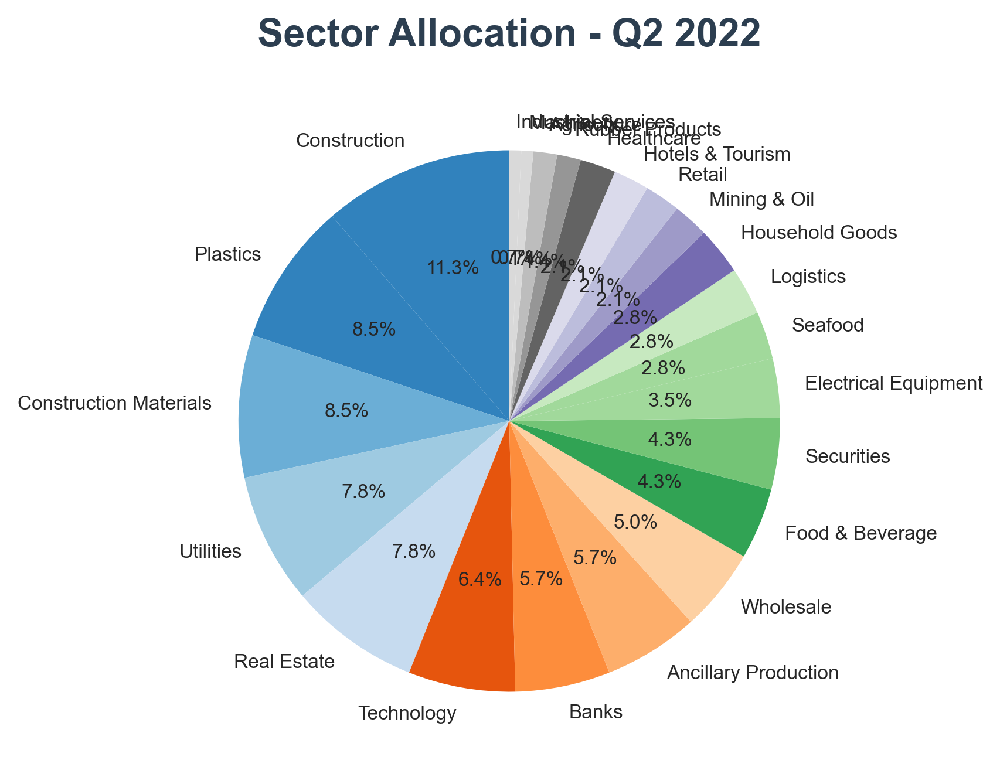


--- Q3 2022 (Portfolio set on 2022-06-30) ---
Risk Signals for the Quarter:
  - Market Regime            : Bear
  - Realized Volatility      : 23.85%
  - Volatility Exposure      : 62.91%
  - Regime Exposure          : 50.00%
  - Final Hybrid Exposure    : 50.00%

Portfolio Holdings (Top 15 of 141):


,ticker,sector,signal,weight_aggressive,weight_final
1433293,HU1,Real Estate,3.000,0.71%,0.35%
1433657,VE8,Construction,3.000,0.71%,0.35%
1433498,SCI,Construction,3.000,0.71%,0.35%
1433268,HII,Plastics,3.000,0.71%,0.35%
1433095,BLF,Food & Beverage,3.000,0.71%,0.35%
1433336,KTT,Construction,3.000,0.71%,0.35%
1433411,ONE,Technology,3.000,0.71%,0.35%
1433077,ASP,Utilities,3.000,0.71%,0.35%
1433597,TMB,Mining & Oil,3.000,0.71%,0.35%
1433541,SPM,Healthcare,3.000,0.71%,0.35%


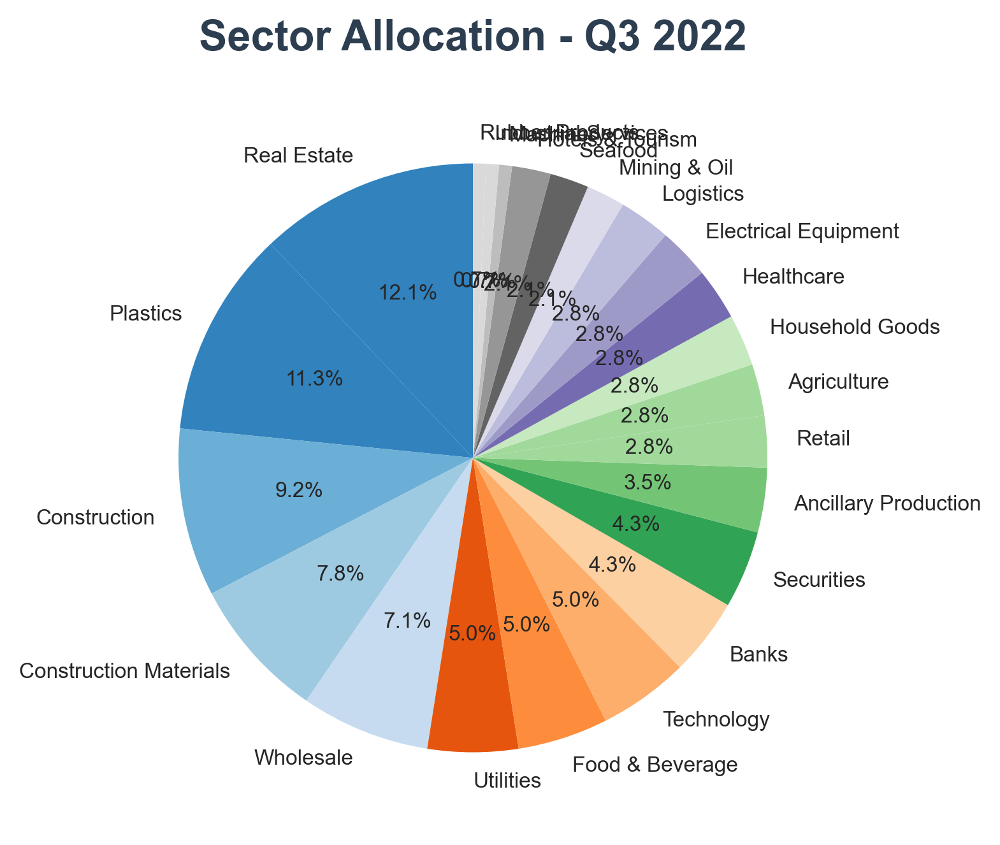


--- Q4 2022 (Portfolio set on 2022-09-30) ---
Risk Signals for the Quarter:
  - Market Regime            : Bear
  - Realized Volatility      : 14.75%
  - Volatility Exposure      : 100.00%
  - Regime Exposure          : 50.00%
  - Final Hybrid Exposure    : 50.00%

Portfolio Holdings (Top 15 of 142):


,ticker,sector,signal,weight_aggressive,weight_final
1520800,ASP,Utilities,3.000,0.70%,0.35%
1521382,VE8,Construction,3.000,0.70%,0.35%
1521059,KTT,Construction,3.000,0.70%,0.35%
1521196,PVG,Utilities,3.000,0.70%,0.35%
1521016,HU1,Real Estate,3.000,0.70%,0.35%
1521322,TMB,Mining & Oil,3.000,0.70%,0.35%
1521134,ONE,Technology,3.000,0.70%,0.35%
1520818,BLF,Food & Beverage,3.000,0.70%,0.35%
1520991,HII,Plastics,3.000,0.70%,0.35%
1521385,VGP,Logistics,3.000,0.70%,0.35%


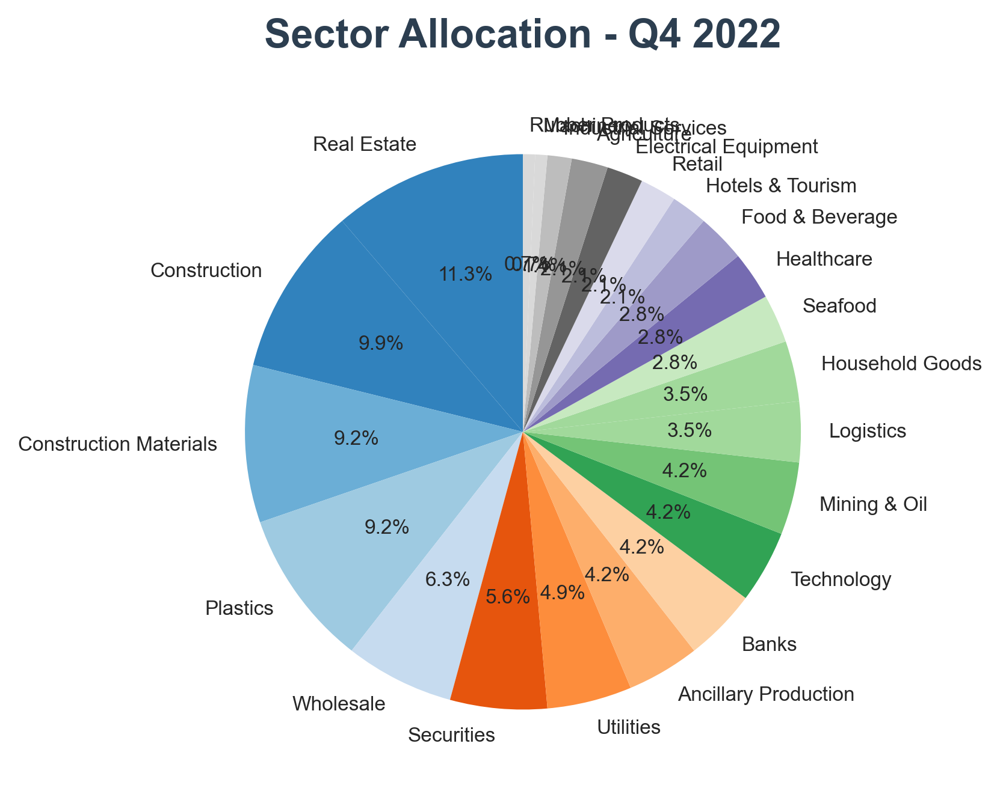

In [12]:
# --- Execute the Rebuilt Analysis for 2022 ---
generate_rebuilt_annual_deep_dive(
    year=2022,
    strategy_type='Value',
    all_returns_df=all_returns,
    factor_data_raw=factor_data_raw,
    daily_returns_matrix=daily_returns_matrix,
    market_regimes=market_regimes,
    sector_info=sector_info,
    config=CONFIG
)